# Predict diabetes

The Synthea EHR data was used to develop a classification model to predict onset of diabetes from previous diagnosed conditions and clinical observations documented in electronic health records. 

In [1]:
conda install -c conda-forge folium


Solving environment: done


==> WARNING: A newer version of conda exists. <==
  current version: 23.3.1
  latest version: 23.5.0

Please update conda by running

    $ conda update -n base -c defaults conda

Or to minimize the number of packages updated during conda update use

     conda install conda=23.5.0



# All requested packages already installed.


Note: you may need to restart the kernel to use updated packages.


In [2]:
conda install -c conda-forge/label/gcc7 missingno

Solving environment: done


==> WARNING: A newer version of conda exists. <==
  current version: 23.3.1
  latest version: 23.5.0

Please update conda by running

    $ conda update -n base -c defaults conda

Or to minimize the number of packages updated during conda update use

     conda install conda=23.5.0



## Package Plan ##

  environment location: /Users/linahrusere/anaconda3

  added / updated specs:
    - missingno


The following packages will be UPDATED:

  ca-certificates    conda-forge::ca-certificates-2023.5.7~ --> pkgs/main::ca-certificates-2023.05.30-hca03da5_0 

The following packages will be SUPERSEDED by a higher-priority channel:

  certifi            conda-forge/noarch::certifi-2023.5.7-~ --> pkgs/main/osx-arm64::certifi-2023.5.7-py310hca03da5_0 




Preparing transaction: done
Verifying transaction: done
Executing transaction: done

Note: you may need to restart the kernel to use updated packages.


In [3]:
conda install -c conda-forge xgboost

Solving environment: done


==> WARNING: A newer version of conda exists. <==
  current version: 23.3.1
  latest version: 23.5.0

Please update conda by running

    $ conda update -n base -c defaults conda

Or to minimize the number of packages updated during conda update use

     conda install conda=23.5.0



## Package Plan ##

  environment location: /Users/linahrusere/anaconda3

  added / updated specs:
    - xgboost


The following packages will be SUPERSEDED by a higher-priority channel:

  ca-certificates    pkgs/main::ca-certificates-2023.05.30~ --> conda-forge::ca-certificates-2023.5.7-hf0a4a13_0 
  certifi            pkgs/main/osx-arm64::certifi-2023.5.7~ --> conda-forge/noarch::certifi-2023.5.7-pyhd8ed1ab_0 




Preparing transaction: done
Verifying transaction: done
Executing transaction: done

Note: you may need to restart the kernel to use updated packages.


In [4]:
import numpy as np
import pandas as pd
import json
import os
from datetime import datetime
import matplotlib
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline 
import warnings
warnings.filterwarnings('ignore')
pd.set_option('display.max_colwidth', 50)
from tqdm import tqdm

In [5]:
import warnings
warnings.filterwarnings('ignore')

In [6]:
import glob

df_dict =dict()

files = glob.glob("/Users/linahrusere/Documents/EHR/coherent-11-07-2022/csv/*.csv")
for a in files:
    df_name = a.split('/')[-1].split('.')[0] + "_df"
    df= pd.read_csv(a)
    df_dict[df_name] = df


In [7]:
df_dict.keys()

dict_keys(['medications_df', 'providers_df', 'patients_payer_df', 'payer_transitions_df', 'imaging_studies_df', 'providers_organization_df', 'supplies_df', 'payers_df', 'allergies_df', 'procedures_df', 'organizations_df', 'conditions_df', 'careplans_df', 'encounters_df', 'devices_df', 'immunizations_df', 'patients_df', 'observations_df'])

In [8]:
patients_df = df_dict['patients_df']
patients_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3539 entries, 0 to 3538
Data columns (total 25 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Id                   3539 non-null   object 
 1   BIRTHDATE            3539 non-null   object 
 2   DEATHDATE            1539 non-null   object 
 3   SSN                  3539 non-null   object 
 4   DRIVERS              3484 non-null   object 
 5   PASSPORT             3435 non-null   object 
 6   PREFIX               3479 non-null   object 
 7   FIRST                3539 non-null   object 
 8   LAST                 3539 non-null   object 
 9   SUFFIX               62 non-null     object 
 10  MAIDEN               1115 non-null   object 
 11  MARITAL              3247 non-null   object 
 12  RACE                 3539 non-null   object 
 13  ETHNICITY            3539 non-null   object 
 14  GENDER               3539 non-null   object 
 15  BIRTHPLACE           3539 non-null   o

In [9]:
encounters_df = df_dict['encounters_df'][['Id', 'START', 'STOP', 'PATIENT']]
encounters_df['START'] =pd.to_datetime(encounters_df['START'], infer_datetime_format=True)
encounters_df['STOP'] =pd.to_datetime(encounters_df['STOP'], infer_datetime_format=True)
encounters_df.rename(columns={'START':"DATE", 'Id':"ENCOUNTER"}, inplace=True)

encounters_df

,ENCOUNTER,DATE,STOP,PATIENT
0,03bc904a-c655-0580-a620-264b065c01e6,1991-06-23 08:57:56+00:00,1991-06-23 09:12:56+00:00,8b0484cd-3dbd-8b8d-1b72-a32f74a5a846
1,7cfc42ac-357a-c88e-1275-9d63f900b7d8,2001-04-22 08:57:56+00:00,2001-04-22 09:12:56+00:00,8b0484cd-3dbd-8b8d-1b72-a32f74a5a846
2,42dbe56f-5b30-38b3-5634-a9b1a0206e44,1993-10-09 13:11:33+00:00,1993-10-09 13:26:33+00:00,b8eb8d31-1031-fb5b-e207-b9815f80744c
3,d3cbf195-f49a-24f5-fe79-c6dc21fb92da,2003-04-27 08:57:56+00:00,2003-04-27 09:12:56+00:00,8b0484cd-3dbd-8b8d-1b72-a32f74a5a846
4,155aa73b-46da-5808-c218-80a5ed671009,2003-04-27 08:57:56+00:00,2003-04-27 09:12:56+00:00,8b0484cd-3dbd-8b8d-1b72-a32f74a5a846
...,...,...,...,...
285334,e607cf3f-6358-64ca-4865-82e135548701,2021-07-05 05:39:54+00:00,2021-07-05 07:39:54+00:00,3107760e-1dce-a177-4122-725241aae61a
285335,c2f687b6-8707-b1ba-b42b-bae4a1507bec,2021-07-08 07:39:54+00:00,2021-07-08 10:39:54+00:00,3107760e-1dce-a177-4122-725241aae61a
285336,231e25ae-3948-b9c9-646b-aaa0c0ee1d38,2021-07-11 10:39:54+00:00,2021-07-11 13:39:54+00:00,3107760e-1dce-a177-4122-725241aae61a
285337,8b99abe7-6a7c-c2be-3e86-7d6959e04c6e,2021-07-14 13:39:54+00:00,2021-07-14 16:39:54+00:00,3107760e-1dce-a177-4122-725241aae61a


In [10]:
#Calculate age at encounter
birthdate_df= patients_df[['Id', 'BIRTHDATE']]
encounters_df = pd.merge(encounters_df, birthdate_df, left_on="PATIENT", right_on="Id", how="left").drop(['Id'], axis=1)
#Get patient age at visit
encounters_df['BIRTHDATE'] =pd.to_datetime(encounters_df['BIRTHDATE'], infer_datetime_format=True)
#Calculate age
encounters_df["firstyear"]= encounters_df['BIRTHDATE'].apply(lambda x : (x.year))
encounters_df["visit_year"]= encounters_df["DATE"].apply(lambda x : (x.year))
encounters_df["AGE"] = encounters_df["visit_year"] - encounters_df["firstyear"]
encounters_df=encounters_df.drop(columns=["visit_year","firstyear", 'BIRTHDATE'])

In [11]:
encounters_df

,ENCOUNTER,DATE,STOP,PATIENT,AGE
0,03bc904a-c655-0580-a620-264b065c01e6,1991-06-23 08:57:56+00:00,1991-06-23 09:12:56+00:00,8b0484cd-3dbd-8b8d-1b72-a32f74a5a846,34
1,7cfc42ac-357a-c88e-1275-9d63f900b7d8,2001-04-22 08:57:56+00:00,2001-04-22 09:12:56+00:00,8b0484cd-3dbd-8b8d-1b72-a32f74a5a846,44
2,42dbe56f-5b30-38b3-5634-a9b1a0206e44,1993-10-09 13:11:33+00:00,1993-10-09 13:26:33+00:00,b8eb8d31-1031-fb5b-e207-b9815f80744c,18
3,d3cbf195-f49a-24f5-fe79-c6dc21fb92da,2003-04-27 08:57:56+00:00,2003-04-27 09:12:56+00:00,8b0484cd-3dbd-8b8d-1b72-a32f74a5a846,46
4,155aa73b-46da-5808-c218-80a5ed671009,2003-04-27 08:57:56+00:00,2003-04-27 09:12:56+00:00,8b0484cd-3dbd-8b8d-1b72-a32f74a5a846,46
...,...,...,...,...,...
285334,e607cf3f-6358-64ca-4865-82e135548701,2021-07-05 05:39:54+00:00,2021-07-05 07:39:54+00:00,3107760e-1dce-a177-4122-725241aae61a,99
285335,c2f687b6-8707-b1ba-b42b-bae4a1507bec,2021-07-08 07:39:54+00:00,2021-07-08 10:39:54+00:00,3107760e-1dce-a177-4122-725241aae61a,99
285336,231e25ae-3948-b9c9-646b-aaa0c0ee1d38,2021-07-11 10:39:54+00:00,2021-07-11 13:39:54+00:00,3107760e-1dce-a177-4122-725241aae61a,99
285337,8b99abe7-6a7c-c2be-3e86-7d6959e04c6e,2021-07-14 13:39:54+00:00,2021-07-14 16:39:54+00:00,3107760e-1dce-a177-4122-725241aae61a,99


### Careplans

In [12]:
careplans_df = df_dict['careplans_df']
list(careplans_df['DESCRIPTION'].unique())

['Diabetes self management plan',
 'Physical therapy procedure',
 'Lifestyle education regarding hypertension',
 'Demential management',
 'Musculoskeletal care',
 'Wound care',
 'Self-care interventions (procedure)',
 'Urinary tract infection care',
 'Routine antenatal care',
 'Respiratory therapy',
 'Fracture care',
 'Chronic obstructive pulmonary disease clinical management plan',
 'Hyperlipidemia clinical management plan',
 'Cancer care plan',
 'Heart failure self management plan',
 'Inpatient care plan (record artifact)',
 'Allergic disorder monitoring',
 'Major surgery care management',
 'Burn care',
 'Minor surgery care management (procedure)',
 'Asthma self management',
 'Skin condition care',
 'Care Plan',
 'Psychiatry care plan',
 'Terminal care',
 'Care plan (record artifact)',
 'Head injury rehabilitation',
 'Mental health care plan',
 'Dialysis care plan (record artifact)',
 'Overactivity/inattention behavior management',
 'Postoperative care',
 'Spinal cord injury rehabili

In [13]:
careplans_df['DESCRIPTION'].value_counts()

Respiratory therapy                                               2235
Diabetes self management plan                                     1667
Lifestyle education regarding hypertension                        1126
Fracture care                                                      985
Musculoskeletal care                                               933
Routine antenatal care                                             840
Hyperlipidemia clinical management plan                            829
Inpatient care plan (record artifact)                              672
Physical therapy procedure                                         661
Wound care                                                         544
Cancer care plan                                                   524
Demential management                                               507
Self-care interventions (procedure)                                453
Heart failure self management plan                                 331
Care P

In [14]:
careplans_df

,Id,START,STOP,PATIENT,ENCOUNTER,CODE,DESCRIPTION,REASONCODE,REASONDESCRIPTION
0,a6fa2d54-bfc7-677d-43e9-8f9639eb1548,2001-04-22,NaN,8b0484cd-3dbd-8b8d-1b72-a32f74a5a846,7cfc42ac-357a-c88e-1275-9d63f900b7d8,698360004,Diabetes self management plan,15777000.0,Prediabetes
1,cf59dfa7-6c8e-2bbf-9cf9-37e9f87cc4a8,2011-09-01,2011-09-15,8b0484cd-3dbd-8b8d-1b72-a32f74a5a846,92ad6010-058a-0362-d0df-86fcad3edf80,91251008,Physical therapy procedure,70704007.0,Sprain of wrist
2,6b83bab0-fcdc-c5cd-3579-a6bd7d6e261b,1993-10-09,NaN,b8eb8d31-1031-fb5b-e207-b9815f80744c,42dbe56f-5b30-38b3-5634-a9b1a0206e44,443402002,Lifestyle education regarding hypertension,59621000.0,Hypertension
3,e7787619-cb0d-8483-5efa-9d7f89e866e4,1987-05-22,NaN,ce9bd436-6b59-0452-86a4-61f3642736bc,5145eae4-d489-09a3-c60c-a59f2a662b24,698360004,Diabetes self management plan,15777000.0,Prediabetes
4,da02b168-5220-1752-823c-7e829345be69,2006-07-14,NaN,ce9bd436-6b59-0452-86a4-61f3642736bc,a08049fb-cfe9-bbbc-9ab6-b0a2f9125a2f,386257007,Demential management,230265002.0,Familial Alzheimer's disease of early onset (d...
...,...,...,...,...,...,...,...,...,...
14110,752f620f-b464-ec6d-850f-2ef7c6bd4d12,1968-01-21,NaN,4c84197b-e4e9-b971-e642-52ee9bb102cf,6b534499-aa6c-afb1-01a2-7704c073b5d7,698360004,Diabetes self management plan,15777000.0,Prediabetes
14111,8cf3e66a-443f-3d94-94e3-c46539625b67,2011-02-06,NaN,4c84197b-e4e9-b971-e642-52ee9bb102cf,bef0defa-0f84-6910-0880-133dedd9d2eb,736285004,Hyperlipidemia clinical management plan,55822004.0,Hyperlipidemia
14112,f8675d70-27b6-bc52-84c7-971377e4a27a,1945-01-07,NaN,3107760e-1dce-a177-4122-725241aae61a,038b99f5-e935-a7e6-e670-1e370f7313ed,698360004,Diabetes self management plan,15777000.0,Prediabetes
14113,962b1e99-2ffb-02b8-d8d3-314da0a1f7d7,1965-12-12,NaN,3107760e-1dce-a177-4122-725241aae61a,c1f4727c-9533-afe5-7f07-afff3cd18dba,736285004,Hyperlipidemia clinical management plan,55822004.0,Hyperlipidemia


# Explore conditions data

In [15]:
conditions_df=df_dict['conditions_df']
conditions_df['START'] =pd.to_datetime(conditions_df['START'], infer_datetime_format=True)
conditions_df['STOP'] =pd.to_datetime(conditions_df['STOP'], infer_datetime_format=True)
conditions_df.rename(columns={'START':"DATE"}, inplace=True)
conditions_df

,DATE,STOP,PATIENT,ENCOUNTER,CODE,DESCRIPTION
0,1991-06-23,NaT,8b0484cd-3dbd-8b8d-1b72-a32f74a5a846,03bc904a-c655-0580-a620-264b065c01e6,162864005,Body mass index 30+ - obesity (finding)
1,2001-04-22,NaT,8b0484cd-3dbd-8b8d-1b72-a32f74a5a846,7cfc42ac-357a-c88e-1275-9d63f900b7d8,15777000,Prediabetes
2,2003-04-27,NaT,8b0484cd-3dbd-8b8d-1b72-a32f74a5a846,d3cbf195-f49a-24f5-fe79-c6dc21fb92da,271737000,Anemia (disorder)
3,1993-10-09,NaT,b8eb8d31-1031-fb5b-e207-b9815f80744c,42dbe56f-5b30-38b3-5634-a9b1a0206e44,59621000,Hypertension
4,2011-09-01,2011-09-15,8b0484cd-3dbd-8b8d-1b72-a32f74a5a846,92ad6010-058a-0362-d0df-86fcad3edf80,70704007,Sprain of wrist
...,...,...,...,...,...,...
35869,1965-11-21,NaT,3107760e-1dce-a177-4122-725241aae61a,9610387f-2967-e8b0-9494-487b83e5cae6,55822004,Hyperlipidemia
35870,1998-10-25,NaT,3107760e-1dce-a177-4122-725241aae61a,426364ce-8c69-9376-879f-bfa1f092474e,49436004,Atrial Fibrillation
35871,2001-03-11,NaT,3107760e-1dce-a177-4122-725241aae61a,647f0c30-bcdc-01e7-7392-0ac50ef428f3,230690007,Stroke
35872,2012-06-03,NaT,3107760e-1dce-a177-4122-725241aae61a,57450a36-26f1-18e1-fa9c-d7f9a01e78b6,53741008,Coronary Heart Disease


In [16]:
outcomes = ['Prediabetes', 'Diabetes'
]
diabetic = conditions_df[conditions_df['DESCRIPTION'].isin(outcomes)]

In [17]:
diabetic_patients_list = list(diabetic['PATIENT'].unique())


In [18]:
len(diabetic_patients_list)

1667

In [19]:
#sort conditions by date
conditions_df = conditions_df.sort_values('DATE')


# Get history of conditions per encounter

In [20]:
conditions_df.tail(60)

,DATE,STOP,PATIENT,ENCOUNTER,CODE,DESCRIPTION
2542,2021-06-23,NaT,5807b8fd-f904-a53c-447b-e68bf9bf42b8,983d78f5-c0a7-9c14-9f03-ac8d25662354,15777000,Prediabetes
2543,2021-06-23,NaT,5807b8fd-f904-a53c-447b-e68bf9bf42b8,983d78f5-c0a7-9c14-9f03-ac8d25662354,271737000,Anemia (disorder)
35184,2021-06-23,2021-07-07,93623e6a-a6fd-b506-c9d3-caac799deab0,3f8437a7-8cde-e854-6511-751ac0c415ac,10509002,Acute bronchitis (disorder)
26703,2021-06-24,NaT,5c5c3cee-6393-faea-2526-5e7094da7193,2bab2816-b1e8-8579-3652-eb3ae5738bf6,72892002,Normal pregnancy
23016,2021-06-24,NaT,805ea1a6-2b49-effb-5228-e0952d5d1ab3,4fe0b776-cd33-9f44-86e1-45d6c5c12b76,230690007,Stroke
11876,2021-06-26,2021-07-03,6ff0d514-d2bc-8e89-09f8-fb2b55c0f9e8,19745554-30bf-3385-9db1-5367b1ab64ab,10509002,Acute bronchitis (disorder)
12377,2021-06-26,2021-07-05,872b0186-8982-f0b2-c6e2-9bf4123ad073,c939ee54-a646-c87d-a60c-8af3dd09e0f9,195662009,Acute viral pharyngitis (disorder)
5985,2021-06-27,2021-07-04,325d2060-9bab-cddb-4f46-1a791e49c420,5a2c3bfb-750f-2c9e-18be-088a870d18d1,444814009,Viral sinusitis (disorder)
11399,2021-06-27,NaT,4adafedf-571d-394b-e9e4-227ebaa60c79,91b34940-99ab-7223-9545-3d32e6d6102d,19169002,Miscarriage in first trimester
11398,2021-06-27,2021-07-11,4adafedf-571d-394b-e9e4-227ebaa60c79,91b34940-99ab-7223-9545-3d32e6d6102d,72892002,Normal pregnancy


In [21]:
pregnancy= ['Normal pregnancy',
'Miscarriage in first trimester',
'Tubal pregnancy',
'Fetus with unknown complication',
'Antepartum eclampsia',
'Preeclampsia',
'Blighted ovum'
]

infection=['Otitis media','Escherichia coli urinary tract infection','Cystitis','Recurrent urinary tract infection']
respiratory_ifection = ['Viral sinusitis (disorder)', 
                         'Acute bronchitis (disorder)',
                         'Acute viral pharyngitis (disorder)',
                         'Chronic sinusitis (disorder)',
                         'Streptococcal sore throat (disorder)',
                         'Acute bacterial sinusitis (disorder)',
                         'Sinusitis (disorder)',
                         'Pulmonary emphysema (disorder)',
                        'Pneumonia',
                         'Chronic obstructive bronchitis (disorder)'
                        ]
seizure = ['Seizure disorder','History of single seizure (situation)']
woundcare= ['Laceration of thigh','Laceration of forearm','Laceration of foot','Facial laceration', 'Laceration of hand']

heart_condition=['Cardiac Arrest','History of cardiac arrest (situation)','Stroke','Chronic congestive heart failure (disorder)','Coronary Heart Disease',
               'Atrial Fibrillation','Myocardial Infarction','History of myocardial infarction (situation)']

associated_condition=['Hypertension','Body mass index 30+ - obesity (finding)','Body mass index 40+ - severely obese (finding)','Anemia (disorder)','Prediabetes','Diabetes',
         'Childhood asthma','Perennial allergic rhinitis','Hyperglycemia (disorder)','Hyperlipidemia','Metabolic syndrome X (disorder)',
          'Hypertriglyceridemia','Chronic intractable migraine without aura','Alcoholism','Idiopathic atrophic hypothyroidism','Smokes tobacco daily',
         'Gout']

In [22]:
conditions = pregnancy + infection + respiratory_ifection + seizure + woundcare + heart_condition + associated_condition

conditions_df.loc[~conditions_df['DESCRIPTION'].isin(conditions), 'DESCRIPTION'] = "Other"

In [23]:
conditions_df['DESCRIPTION'] = conditions_df['DESCRIPTION'].replace(pregnancy, 'pregnancy')
conditions_df['DESCRIPTION'] = conditions_df['DESCRIPTION'].replace(infection, 'infection')
conditions_df['DESCRIPTION'] = conditions_df['DESCRIPTION'].replace(respiratory_ifection, 'respiratory_ifection')
conditions_df['DESCRIPTION'] = conditions_df['DESCRIPTION'].replace(seizure, 'seizure')
conditions_df['DESCRIPTION'] = conditions_df['DESCRIPTION'].replace(woundcare, 'woundcare')
conditions_df['DESCRIPTION'] = conditions_df['DESCRIPTION'].replace(heart_condition, 'heart_condition')

In [24]:
conditions_df.tail(60)

,DATE,STOP,PATIENT,ENCOUNTER,CODE,DESCRIPTION
2542,2021-06-23,NaT,5807b8fd-f904-a53c-447b-e68bf9bf42b8,983d78f5-c0a7-9c14-9f03-ac8d25662354,15777000,Prediabetes
2543,2021-06-23,NaT,5807b8fd-f904-a53c-447b-e68bf9bf42b8,983d78f5-c0a7-9c14-9f03-ac8d25662354,271737000,Anemia (disorder)
35184,2021-06-23,2021-07-07,93623e6a-a6fd-b506-c9d3-caac799deab0,3f8437a7-8cde-e854-6511-751ac0c415ac,10509002,respiratory_ifection
26703,2021-06-24,NaT,5c5c3cee-6393-faea-2526-5e7094da7193,2bab2816-b1e8-8579-3652-eb3ae5738bf6,72892002,pregnancy
23016,2021-06-24,NaT,805ea1a6-2b49-effb-5228-e0952d5d1ab3,4fe0b776-cd33-9f44-86e1-45d6c5c12b76,230690007,heart_condition
11876,2021-06-26,2021-07-03,6ff0d514-d2bc-8e89-09f8-fb2b55c0f9e8,19745554-30bf-3385-9db1-5367b1ab64ab,10509002,respiratory_ifection
12377,2021-06-26,2021-07-05,872b0186-8982-f0b2-c6e2-9bf4123ad073,c939ee54-a646-c87d-a60c-8af3dd09e0f9,195662009,respiratory_ifection
5985,2021-06-27,2021-07-04,325d2060-9bab-cddb-4f46-1a791e49c420,5a2c3bfb-750f-2c9e-18be-088a870d18d1,444814009,respiratory_ifection
11399,2021-06-27,NaT,4adafedf-571d-394b-e9e4-227ebaa60c79,91b34940-99ab-7223-9545-3d32e6d6102d,19169002,pregnancy
11398,2021-06-27,2021-07-11,4adafedf-571d-394b-e9e4-227ebaa60c79,91b34940-99ab-7223-9545-3d32e6d6102d,72892002,pregnancy


In [25]:
# Label encode all the conditions

from sklearn.preprocessing import LabelEncoder
# creating initial dataframe
Conditions = list(conditions_df['DESCRIPTION'].unique())
Conditions_hashmap = pd.DataFrame(Conditions, columns=['Conditions'])
# creating instance of labelencoder
labelencoder = LabelEncoder()
# Assigning numerical values and storing in another column
Conditions_hashmap['Conditions_label'] = labelencoder.fit_transform(Conditions_hashmap['Conditions'])
Conditions_hashmap

,Conditions,Conditions_label
0,infection,18
1,seizure,21
2,Other,13
3,heart_condition,17
4,respiratory_ifection,20
5,Childhood asthma,4
6,Perennial allergic rhinitis,14
7,Body mass index 30+ - obesity (finding),2
8,woundcare,22
9,pregnancy,19


In [26]:
# get list of all diabetic conditions labels 
oc_df = Conditions_hashmap[Conditions_hashmap['Conditions'].isin(outcomes)]
diabetic_outcomes_labels= list(oc_df['Conditions_label'])

In [27]:
diabetic_outcomes_labels

[15, 6]

In [28]:
# Get conditionds label for each encounter

history_conditions=conditions_df.merge(Conditions_hashmap, how='left', left_on='DESCRIPTION', right_on='Conditions')
history_conditions = history_conditions[['DATE', 'PATIENT', 'ENCOUNTER', 'Conditions_label']]
history_conditions

,DATE,PATIENT,ENCOUNTER,Conditions_label
0,1912-01-22,0059312d-6c30-10fc-9c05-d631ce28cb17,9002a278-9e90-999d-c627-1d0ccaaa3a5a,18
1,1912-10-03,dcbbcf1d-489c-dee1-8968-7a9ffcab60a3,0be115a0-64ec-4667-0fd0-9440d647ec56,21
2,1912-10-03,6a337c76-6eee-43b2-d34a-54c05e5da8ef,0100534f-deda-f025-97cf-36ef0ef74a0d,21
3,1912-10-03,dcbbcf1d-489c-dee1-8968-7a9ffcab60a3,0be115a0-64ec-4667-0fd0-9440d647ec56,21
4,1912-10-03,6a337c76-6eee-43b2-d34a-54c05e5da8ef,0100534f-deda-f025-97cf-36ef0ef74a0d,13
...,...,...,...,...
35869,2021-07-17,c03812a9-8d7f-d554-5039-6ec757cc2bea,860984d7-15e6-1e27-2a11-d1d07f88fc91,20
35870,2021-07-19,891d4961-32a1-1652-7f4e-bbbf129aa94b,ffa942e1-3225-ba73-18d8-26f5d28f3131,2
35871,2021-07-19,6078b24f-bf7b-74d5-543a-d4fc118be176,c9aeb3cd-d691-5199-fe24-9ef6a18f07da,17
35872,2021-07-21,f4b01035-a646-6699-cf6f-f858f432bc84,e774dad5-c86f-8ea2-3abd-efdf10eb1b55,13


In [29]:
#Get list of all conditions per patient and list of acorresponding encounters 
history_conditions = history_conditions.groupby(['PATIENT']).apply(lambda x: [list(x['Conditions_label']), list(x['ENCOUNTER'])]).apply(pd.Series)
history_conditions= history_conditions.reset_index()
history_conditions.columns = ['PATIENT', 'labels', 'encounters']

In [30]:
history_conditions

,PATIENT,labels,encounters
0,0020dcbe-9f8d-920d-c008-d68debcef322,"[17, 20, 13, 17, 17]","[42a0fa92-a1e8-22c8-1b93-2a3e7bd7dbbf, df64a93..."
1,0059312d-6c30-10fc-9c05-d631ce28cb17,"[18, 20, 20, 20, 13]","[9002a278-9e90-999d-c627-1d0ccaaa3a5a, 707ec63..."
2,0060bded-e53c-348d-a1ab-fda3b7260151,"[20, 20, 20, 6, 13, 13, 20, 1]","[599083a7-532a-f94b-869b-3b3e558fecb7, 0f3695e..."
3,0074596f-5fd0-7965-db0f-cce71c81567d,"[2, 10, 19, 20, 9, 13, 13, 13, 13, 22, 20, 13,...","[cac1f21a-eb94-a69c-f583-340cd3147e22, 7ad6092..."
4,00875442-ebdf-6db2-9979-a09efa3a3c30,"[2, 1, 15, 20, 20, 20, 20, 19, 19, 19, 19, 19]","[1c55fb6b-f9f5-b04b-dce8-ba3e3dd2b1ae, 862db5c..."
...,...,...,...
3530,ffbbfa5b-12c0-1084-d65c-bd8a03cf523a,"[0, 2, 13, 13, 20, 13, 22, 13, 13, 13]","[a0978ffa-7060-441b-b3f8-977630f13ac4, 1425db5..."
3531,ffbcab98-e343-a532-992f-7019ad696149,"[20, 13]","[61724d60-d8ee-db40-48ab-ff3451170557, da159bc..."
3532,ffc367b1-8835-d1bd-ce83-eb45963f2e90,"[13, 21, 21, 20, 20]","[245e9a1f-d638-aa51-65cc-a292db42dee9, 245e9a1..."
3533,ffce3431-ba26-7d3a-2d71-08adce6d5927,"[2, 13, 13, 13, 9, 20, 20, 13, 13, 20, 20, 20,...","[40ff999d-1b18-d984-30f7-2a865e0b9eaa, cf862a8..."


In [31]:
Conditions_hashmap.head(60)

,Conditions,Conditions_label
0,infection,18
1,seizure,21
2,Other,13
3,heart_condition,17
4,respiratory_ifection,20
5,Childhood asthma,4
6,Perennial allergic rhinitis,14
7,Body mass index 30+ - obesity (finding),2
8,woundcare,22
9,pregnancy,19


In [32]:
#  Get the encounter condition and any recorded conditions before the encounter
encounter_dict = {}
outcome_label = {}
prediabetes = {}
diabetes = {}
diabetic = {}
num_diabetic_visits = {}
for i, row in history_conditions.iterrows():
    for j in range(len(row['encounters'])):
        encounter = row['encounters'][j] #Get the encounter condition
        history = row['labels'][:j] #Get the encounter conditions history.
        encounter_dict[encounter] = history 
        label = row['labels'][j]
        outcome_label[encounter] = label
        
        if label == 15:
            prediabetes[encounter] = 1 #If the encounter condition is prediabetes (1), if not (0)  
        else:
            prediabetes[encounter] = 0
        if label == 6:
            diabetes[encounter] = 1 #If the encounter condition is diabetes (1), if not (0)  
        else:
            diabetes[encounter] = 0
        if label in diabetic_outcomes_labels:
            diabetic[encounter] = 1 #If the encounter condition is prediabetes (1), if not (0)  
        else:
            diabetic[encounter] = 0
        
        visits = sum(x in diabetic_outcomes_labels for x in history)#Get the number diabetes related encounters in history
        num_diabetic_visits[encounter] = visits
            
        
history_encounter_conditions = pd.concat([pd.DataFrame([encounter_dict]),
                                          pd.DataFrame([num_diabetic_visits]), 
                                          pd.DataFrame([outcome_label]), 
                                          pd.DataFrame([prediabetes]),
                                          pd.DataFrame([diabetes]),
                                          pd.DataFrame([diabetic]),
                                         ])

In [33]:
history_encounter_conditions

,42a0fa92-a1e8-22c8-1b93-2a3e7bd7dbbf,df64a93a-cc4b-2cd5-e6c2-15abe2855e29,932c41f9-92de-9053-9857-c8c6fcc67933,b7f91832-454d-dd72-b45a-96f9c9c857e0,9002a278-9e90-999d-c627-1d0ccaaa3a5a,707ec632-3002-12ef-20d1-360105f8fdd3,ca0d1a7a-5197-9903-9321-249cdcfad71a,84ef537c-53fa-f5e9-8171-e9b5f3db3c8c,8e06e492-77fc-7df1-50ba-f5b6176e3a74,599083a7-532a-f94b-869b-3b3e558fecb7,...,0169285f-47ae-e3a5-a51f-5127648349bd,929b3349-6006-60ec-034b-51e4a64b8782,a4c76f80-abe5-9202-157b-f1b2d9501de7,d0fd0612-ce12-9578-9906-6bf3dc8be97c,01e884b5-4230-8d71-bcee-240a3a1c3fde,508de3a7-670c-4f38-7315-fa087972f38e,04974d6b-f303-b55c-06f9-f7447ec9d42e,e355799c-7c36-c3fb-a7e0-d74cbc353667,8c629ebf-6855-da36-c5bd-1187e3d8b67f,46f3133f-6a26-dbac-78b8-a3ff26c8e553
0,[],[17],"[17, 20]","[17, 20, 13, 17]",[],[18],"[18, 20]","[18, 20, 20]","[18, 20, 20, 20]",[],...,"[2, 13, 13, 13, 9, 20, 20, 13, 13, 20, 20]","[2, 13, 13, 13, 9, 20, 20, 13, 13, 20, 20, 20]",[17],"[17, 17]","[17, 17, 19]","[17, 17, 19, 20]","[17, 17, 19, 20, 18]","[17, 17, 19, 20, 18, 17]","[17, 17, 19, 20, 18, 17, 20]","[17, 17, 19, 20, 18, 17, 20, 17]"
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
0,17,20,13,17,18,20,20,20,13,20,...,20,20,17,19,20,18,17,20,17,15
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1


In [34]:
#Transpose df and add column labels
history_df = history_encounter_conditions.T.reset_index()
history_df.columns = ['ENCOUNTER', "history", 'num_diabetic_visits', 'outcome', 'prediabetes', 'diabetes', 'prediabetes/diabetes']

In [35]:
history_df

,ENCOUNTER,history,num_diabetic_visits,outcome,prediabetes,diabetes,prediabetes/diabetes
0,42a0fa92-a1e8-22c8-1b93-2a3e7bd7dbbf,[],0,17,0,0,0
1,df64a93a-cc4b-2cd5-e6c2-15abe2855e29,[17],0,20,0,0,0
2,932c41f9-92de-9053-9857-c8c6fcc67933,"[17, 20]",0,13,0,0,0
3,b7f91832-454d-dd72-b45a-96f9c9c857e0,"[17, 20, 13, 17]",0,17,0,0,0
4,9002a278-9e90-999d-c627-1d0ccaaa3a5a,[],0,18,0,0,0
...,...,...,...,...,...,...,...
31086,508de3a7-670c-4f38-7315-fa087972f38e,"[17, 17, 19, 20]",0,18,0,0,0
31087,04974d6b-f303-b55c-06f9-f7447ec9d42e,"[17, 17, 19, 20, 18]",0,17,0,0,0
31088,e355799c-7c36-c3fb-a7e0-d74cbc353667,"[17, 17, 19, 20, 18, 17]",0,20,0,0,0
31089,8c629ebf-6855-da36-c5bd-1187e3d8b67f,"[17, 17, 19, 20, 18, 17, 20]",0,17,0,0,0


# one-hot-encode conditions history_df

In [36]:
from sklearn.preprocessing import MultiLabelBinarizer
mlb = MultiLabelBinarizer()

res = pd.DataFrame(mlb.fit_transform(history_df['history']),
                   columns=mlb.classes_,
                   index=history_df.index)
conditions_history_df = history_df.join(res)

In [37]:
#Rename columns
Conditions_hashmap = Conditions_hashmap.sort_values("Conditions_label")
Conditions_hashmap_sel = Conditions_hashmap[Conditions_hashmap['Conditions_label'].isin(list(conditions_history_df.columns))]
col_dict = Conditions_hashmap_sel.set_index('Conditions_label').to_dict()
conditions_history_df = conditions_history_df.rename(col_dict['Conditions'], axis=1)

In [38]:
conditions_history_df = conditions_history_df.drop('Other', axis=1)

In [39]:
conditions_history_df

,ENCOUNTER,history,num_diabetic_visits,outcome,prediabetes,diabetes,prediabetes/diabetes,Alcoholism,Anemia (disorder),Body mass index 30+ - obesity (finding),...,Metabolic syndrome X (disorder),Perennial allergic rhinitis,Prediabetes,Smokes tobacco daily,heart_condition,infection,pregnancy,respiratory_ifection,seizure,woundcare
0,42a0fa92-a1e8-22c8-1b93-2a3e7bd7dbbf,[],0,17,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,df64a93a-cc4b-2cd5-e6c2-15abe2855e29,[17],0,20,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
2,932c41f9-92de-9053-9857-c8c6fcc67933,"[17, 20]",0,13,0,0,0,0,0,0,...,0,0,0,0,1,0,0,1,0,0
3,b7f91832-454d-dd72-b45a-96f9c9c857e0,"[17, 20, 13, 17]",0,17,0,0,0,0,0,0,...,0,0,0,0,1,0,0,1,0,0
4,9002a278-9e90-999d-c627-1d0ccaaa3a5a,[],0,18,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31086,508de3a7-670c-4f38-7315-fa087972f38e,"[17, 17, 19, 20]",0,18,0,0,0,0,0,0,...,0,0,0,0,1,0,1,1,0,0
31087,04974d6b-f303-b55c-06f9-f7447ec9d42e,"[17, 17, 19, 20, 18]",0,17,0,0,0,0,0,0,...,0,0,0,0,1,1,1,1,0,0
31088,e355799c-7c36-c3fb-a7e0-d74cbc353667,"[17, 17, 19, 20, 18, 17]",0,20,0,0,0,0,0,0,...,0,0,0,0,1,1,1,1,0,0
31089,8c629ebf-6855-da36-c5bd-1187e3d8b67f,"[17, 17, 19, 20, 18, 17, 20]",0,17,0,0,0,0,0,0,...,0,0,0,0,1,1,1,1,0,0


# Explore observations data

In [40]:
observations_df = df_dict['observations_df']
#sort by date
observations_df = observations_df.sort_values('DATE')
observations_df.head()

,DATE,PATIENT,ENCOUNTER,CODE,DESCRIPTION,VALUE,UNITS,TYPE
885473,1911-12-24T02:55:08Z,0059312d-6c30-10fc-9c05-d631ce28cb17,ea9c13db-6056-cee4-8a42-20afa53b8295,8462-4,Diastolic Blood Pressure,53.0,mm[Hg],numeric
885488,1911-12-24T02:55:08Z,0059312d-6c30-10fc-9c05-d631ce28cb17,ea9c13db-6056-cee4-8a42-20afa53b8295,72166-2,Tobacco smoking status NHIS,Never smoker,NaN,text
885487,1911-12-24T02:55:08Z,0059312d-6c30-10fc-9c05-d631ce28cb17,ea9c13db-6056-cee4-8a42-20afa53b8295,32623-1,Platelet mean volume [Entitic volume] in Blood...,10.3,fL,numeric
885486,1911-12-24T02:55:08Z,0059312d-6c30-10fc-9c05-d631ce28cb17,ea9c13db-6056-cee4-8a42-20afa53b8295,32207-3,Platelet distribution width [Entitic volume] i...,364.7,fL,numeric
885485,1911-12-24T02:55:08Z,0059312d-6c30-10fc-9c05-d631ce28cb17,ea9c13db-6056-cee4-8a42-20afa53b8295,777-3,Platelets [#/volume] in Blood by Automated count,324.2,10*3/uL,numeric


In [41]:
#join the units and description columns
observations_df['DATE'] =pd.to_datetime(observations_df['DATE'], infer_datetime_format=True)
observations_df['CODE'] = observations_df['CODE'].astype(str) + '_' +observations_df['UNITS']

In [42]:
observations_df['TYPE'].unique()

array(['numeric', 'text'], dtype=object)

In [43]:
#Divide df into numerical and categotical values
cat_observations = observations_df[observations_df['TYPE']=='text'].drop(columns=['UNITS','TYPE'])
num_observations = observations_df[observations_df['TYPE']=='numeric'].drop(columns=['UNITS','TYPE'])

# Process numeric observations

In [44]:
#cast data to float
num_observations = num_observations.astype({'VALUE':'float'})


In [45]:
num_observations

,DATE,PATIENT,ENCOUNTER,CODE,DESCRIPTION,VALUE
885473,1911-12-24 02:55:08+00:00,0059312d-6c30-10fc-9c05-d631ce28cb17,ea9c13db-6056-cee4-8a42-20afa53b8295,8462-4_mm[Hg],Diastolic Blood Pressure,53.0
885487,1911-12-24 02:55:08+00:00,0059312d-6c30-10fc-9c05-d631ce28cb17,ea9c13db-6056-cee4-8a42-20afa53b8295,32623-1_fL,Platelet mean volume [Entitic volume] in Blood...,10.3
885486,1911-12-24 02:55:08+00:00,0059312d-6c30-10fc-9c05-d631ce28cb17,ea9c13db-6056-cee4-8a42-20afa53b8295,32207-3_fL,Platelet distribution width [Entitic volume] i...,364.7
885485,1911-12-24 02:55:08+00:00,0059312d-6c30-10fc-9c05-d631ce28cb17,ea9c13db-6056-cee4-8a42-20afa53b8295,777-3_10*3/uL,Platelets [#/volume] in Blood by Automated count,324.2
885484,1911-12-24 02:55:08+00:00,0059312d-6c30-10fc-9c05-d631ce28cb17,ea9c13db-6056-cee4-8a42-20afa53b8295,21000-5_fL,Erythrocyte distribution width [Entitic volume...,44.8
...,...,...,...,...,...,...
4900,2021-07-22 14:25:38+00:00,3b89b353-f45e-b2b7-cdf3-b308eed43604,445c65e0-3bbe-e6f8-be71-4600eecbc1d0,8480-6_mm[Hg],Systolic Blood Pressure,138.0
4898,2021-07-22 14:25:38+00:00,3b89b353-f45e-b2b7-cdf3-b308eed43604,445c65e0-3bbe-e6f8-be71-4600eecbc1d0,39156-5_kg/m2,Body Mass Index,30.1
4897,2021-07-22 14:25:38+00:00,3b89b353-f45e-b2b7-cdf3-b308eed43604,445c65e0-3bbe-e6f8-be71-4600eecbc1d0,29463-7_kg,Body Weight,88.9
4895,2021-07-22 14:25:38+00:00,3b89b353-f45e-b2b7-cdf3-b308eed43604,445c65e0-3bbe-e6f8-be71-4600eecbc1d0,8302-2_cm,Body Height,172.0


In [46]:
#convert to wide table
num_observations = pd.pivot_table(num_observations, index=['DATE', 'PATIENT', 'ENCOUNTER'],columns='CODE',values='VALUE')
num_observations_cols = num_observations.columns
num_observations = num_observations.reset_index()

In [47]:
num_observations

CODE,DATE,PATIENT,ENCOUNTER,10230-1_%,10834-0_g/L,10834-0_g/dL,14959-1_mg/g,1742-6_U/L,1742-6_[iU]/L,1751-7_g/dL,...,84215-3_{nominal},8462-4_mm[Hg],8480-6_mm[Hg],85343-2_{#},85344-0_{#},85352-3_{#},8867-4_/min,89579-7_pg/mL,9279-1_/min,9843-4_cm
0,1911-12-24 02:55:08+00:00,0059312d-6c30-10fc-9c05-d631ce28cb17,ea9c13db-6056-cee4-8a42-20afa53b8295,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,53.0,105.0,NaN,NaN,NaN,72.0,NaN,14.0,34.2
1,1912-01-28 02:55:08+00:00,0059312d-6c30-10fc-9c05-d631ce28cb17,9002a278-9e90-999d-c627-1d0ccaaa3a5a,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,56.0,104.0,NaN,NaN,NaN,63.0,NaN,12.0,37.9
2,1912-03-31 02:55:08+00:00,0059312d-6c30-10fc-9c05-d631ce28cb17,d9347bf5-4d9f-abdf-1562-541df005a420,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,56.0,106.0,NaN,NaN,NaN,62.0,NaN,16.0,40.6
3,1912-06-02 02:55:08+00:00,0059312d-6c30-10fc-9c05-d631ce28cb17,6bd86872-fb87-f29c-46aa-c683075ae715,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,52.0,101.0,NaN,NaN,NaN,96.0,NaN,13.0,42.3
4,1912-09-01 02:55:08+00:00,0059312d-6c30-10fc-9c05-d631ce28cb17,3b5c091b-020d-65d8-ee40-94b1adaa5377,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,57.0,99.0,NaN,NaN,NaN,68.0,NaN,14.0,44.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
105110,2021-07-22 00:39:28+00:00,08cc9388-4262-e4f6-0d75-7379566f1806,157bd792-493a-d6b4-41af-f802b43a623e,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,53.0,131.0,NaN,NaN,NaN,76.0,NaN,13.0,NaN
105111,2021-07-22 04:19:28+00:00,50ed200c-bd80-c23a-0524-ca2cb8686f47,0862af4d-45bd-df73-4d76-0d39bc477d4d,NaN,NaN,NaN,107.1,NaN,NaN,NaN,...,NaN,42.0,140.0,NaN,NaN,NaN,90.0,NaN,15.0,NaN
105112,2021-07-22 06:38:22+00:00,ebaf60bb-54d3-d74a-e1eb-6b8eb72aec11,a007ff84-b1db-3c83-c60f-2b915a8d8c6d,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,84.0,144.0,NaN,NaN,NaN,85.0,NaN,15.0,NaN
105113,2021-07-22 10:08:29+00:00,8aff769a-72cc-c49f-21de-987e7c261349,0e194bd2-adf6-557b-eb10-ef38f483e384,NaN,NaN,NaN,25.6,NaN,NaN,NaN,...,NaN,45.0,133.0,NaN,NaN,NaN,80.0,NaN,12.0,NaN


In [48]:
col_list= list(num_observations.columns[3:])

num_observations = num_observations.groupby(['PATIENT']).apply(lambda x: [list(x[col]) for col in col_list]+[list(x['ENCOUNTER'])]).apply(pd.Series)
num_observations= num_observations.reset_index()
num_observations.columns = ['PATIENT'] + col_list+ ['encounters']

In [49]:
# Get the last value in the encounter/history. If there is no value for the encounter/history impute with the mean value for the patient
#If no value for patient put null value

import statistics

dfs=[]
for col in col_list:
    encounter_dict = {}
    fin_values = {}
    for i, row in num_observations.iterrows():
        for j in range(len(row['encounters'])):
            encounter = row['encounters'][j]
            history = row[col][:j+1]
            encounter_dict[encounter] = history
            try:
                num = [x for x in history if not np.isnan(x)][-1]
                fin_values[encounter] = num
            except:
                try:
                    num = statistics.mean([x for x in row[col] if not np.isnan(x)])
                    fin_values[encounter] = num
                except:
                    num = np.nan
                    fin_values[encounter] = num
 
    dfs.append(pd.DataFrame([fin_values]))
    
history_encounter_observations = pd.concat(dfs)
            

In [50]:
num_encounter_observations = history_encounter_observations.T.reset_index()
num_encounter_observations.columns = ["ENCOUNTER"]+col_list

In [51]:
num_encounter_observations

,ENCOUNTER,10230-1_%,10834-0_g/L,10834-0_g/dL,14959-1_mg/g,1742-6_U/L,1742-6_[iU]/L,1751-7_g/dL,17861-6_mg/dL,18262-6_mg/dL,...,84215-3_{nominal},8462-4_mm[Hg],8480-6_mm[Hg],85343-2_{#},85344-0_{#},85352-3_{#},8867-4_/min,89579-7_pg/mL,9279-1_/min,9843-4_cm
0,47ad5717-4cc1-d896-c0ff-ad73b19fba93,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,52.0,102.0,NaN,NaN,NaN,68.0,NaN,15.0,50.8
1,c04ae501-6c84-47b8-8879-94881eea0db1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,54.0,96.0,NaN,NaN,NaN,98.0,NaN,13.0,50.9
2,df64a93a-cc4b-2cd5-e6c2-15abe2855e29,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,54.0,96.0,NaN,NaN,NaN,98.0,NaN,13.0,50.9
3,c80c3c69-a0d8-1c95-01a2-c3463ddbcdc7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,50.0,102.0,NaN,NaN,NaN,67.0,NaN,12.0,50.9
4,f76e1795-cef6-6166-eee7-18edc544a182,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,53.0,105.0,NaN,NaN,NaN,78.0,NaN,12.0,50.9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
98731,97623806-4aba-1d8c-45db-6b5fa1009140,37.4,NaN,NaN,NaN,23.9,NaN,4.1,9.9,92.3,...,NaN,77.0,160.0,NaN,NaN,NaN,61.0,0.0,14.0,NaN
98732,3002632e-fbc3-c1d4-5d22-4430a80ad57c,36.7,NaN,NaN,NaN,23.9,NaN,4.1,9.9,92.3,...,NaN,77.0,160.0,NaN,NaN,NaN,61.0,0.0,14.0,NaN
98733,b38044df-e4a8-8fd9-154b-ce5ed6278aec,36.7,NaN,NaN,NaN,23.9,NaN,4.1,9.9,92.5,...,NaN,77.0,164.0,NaN,NaN,NaN,80.0,0.0,15.0,NaN
98734,2113a818-6371-4481-2828-288820000d6b,36.7,NaN,NaN,NaN,35.8,NaN,4.9,9.1,101.1,...,NaN,77.0,164.0,NaN,NaN,NaN,80.0,0.0,15.0,NaN


### Remove columns with a lot of missing values 


<Axes: >

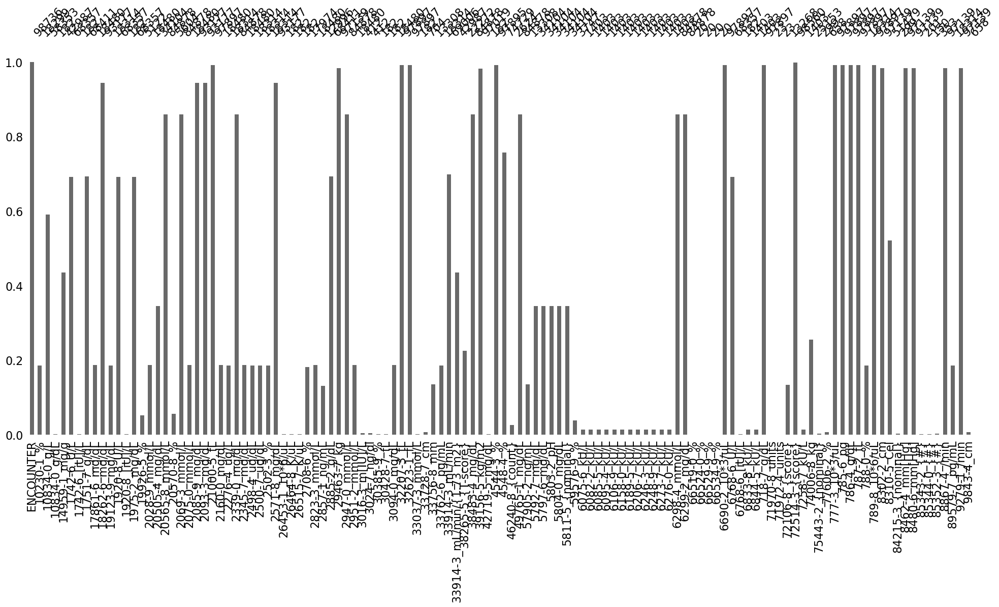

In [52]:
#Visualize missing values in the entire df
import missingno as msno
msno.bar(num_encounter_observations)

In [53]:
#Percentage_of_missing_values
num_encounter_observations.isnull().mean()*100

ENCOUNTER         0.000000
10230-1_%        81.466740
10834-0_g/L      40.899976
10834-0_g/dL     99.815670
14959-1_mg/g     56.462688
                   ...    
85352-3_{#}      99.642481
8867-4_/min       1.617444
89579-7_pg/mL    81.451548
9279-1_/min       1.617444
9843-4_cm        99.333576
Length: 120, dtype: float64

In [54]:
#drop columns with 80% missing values

limit = len(num_encounter_observations) * .80
num_encounter_observations = num_encounter_observations.dropna(thresh=limit, axis=1)

In [55]:
num_encounter_observations = num_encounter_observations.fillna(num_encounter_observations.mean())

# Process categorical observations

In [56]:
# one-hot-encode cat_observations
cat_observations['VALUE'] = cat_observations['CODE'].astype(str) + '_' +cat_observations['VALUE']
cat_observations = cat_observations.drop(columns=['CODE','DESCRIPTION'])
cat_observations = pd.get_dummies(cat_observations, columns = ['VALUE'])
cat_observations

,DATE,PATIENT,ENCOUNTER,VALUE_20454-5_{nominal}_Urine protein test = + (finding),VALUE_20454-5_{nominal}_Urine protein test = ++ (finding),VALUE_20454-5_{nominal}_Urine protein test = +++ (finding),VALUE_2514-8_{nominal}_Urine ketone test = + (finding),VALUE_2514-8_{nominal}_Urine ketone test = +++ (finding),VALUE_2514-8_{nominal}_Urine ketone test = trace (finding),VALUE_25428-4_{nominal}_Urine glucose test = ++ (finding),...


In [57]:
col_list= list(cat_observations.columns[3:])

cat_observations = cat_observations.groupby(['PATIENT']).apply(lambda x: [list(x[col]) for col in col_list]+[list(x['ENCOUNTER'])]).apply(pd.Series)
cat_observations= cat_observations.reset_index()
cat_observations.columns = ['PATIENT'] + col_list+ ['encounters']

In [58]:
cat_observations

,PATIENT,VALUE_20454-5_{nominal}_Urine protein test = + (finding),VALUE_20454-5_{nominal}_Urine protein test = ++ (finding),VALUE_20454-5_{nominal}_Urine protein test = +++ (finding),VALUE_2514-8_{nominal}_Urine ketone test = + (finding),VALUE_2514-8_{nominal}_Urine ketone test = +++ (finding),VALUE_2514-8_{nominal}_Urine ketone test = trace (finding),VALUE_25428-4_{nominal}_Urine glucose test = ++ (finding),VALUE_28245-9_{nominal}_No signs/symptoms,VALUE_28245-9_{nominal}_Severe signs/symptoms,...


In [59]:
# Get the last value in the encounter/history. If there is no value for the encounter/history impute with the last value for the patient

dfs=[]
for col in col_list:
    encounter_dict = {}
    fin_values = {}
    for i, row in cat_observations.iterrows():
        for j in range(len(row['encounters'])):
            encounter = row['encounters'][j]
            history = row[col][:j+1]
            encounter_dict[encounter] = history
            try:
                num = history[-1]
                fin_values[encounter] = num
            except:
                try:
                    num = row[col][-1]
                    fin_values[encounter] = num
                except:
                    num = np.nan
                    fin_values[encounter] = num
 
    dfs.append(pd.DataFrame([fin_values]))
    
history_encounter_observations = pd.concat(dfs)

In [60]:
cat_encounter_observations = history_encounter_observations.T.reset_index()
cat_encounter_observations.columns = ["ENCOUNTER"]+col_list

In [61]:
cat_encounter_observations

,ENCOUNTER,VALUE_20454-5_{nominal}_Urine protein test = + (finding),VALUE_20454-5_{nominal}_Urine protein test = ++ (finding),VALUE_20454-5_{nominal}_Urine protein test = +++ (finding),VALUE_2514-8_{nominal}_Urine ketone test = + (finding),VALUE_2514-8_{nominal}_Urine ketone test = +++ (finding),VALUE_2514-8_{nominal}_Urine ketone test = trace (finding),VALUE_25428-4_{nominal}_Urine glucose test = ++ (finding),VALUE_28245-9_{nominal}_No signs/symptoms,VALUE_28245-9_{nominal}_Severe signs/symptoms,...


In [62]:
#Join observations dfs

observations = pd.merge(num_encounter_observations, cat_encounter_observations, on='ENCOUNTER', how="outer")

In [63]:
observations = observations.reset_index()

In [64]:
observations


,index,ENCOUNTER,18262-6_mg/dL,20565-8_mmol/L,2069-3_mmol/L,2085-9_mg/dL,2093-3_mg/dL,21000-5_fL,2339-0_mg/dL,2571-8_mg/dL,...


In [65]:
#Get patient age at visit
features = pd.merge(conditions_history_df, observations, on='ENCOUNTER', how="left")
final_df = pd.merge(encounters_df, features, on='ENCOUNTER', how="right")


In [66]:
final_df.info(verbose=True, null_counts=True)

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [67]:
#drop columns with 70% missing values
#df = final_df.dropna(thresh=final_df.shape[0]*0.6, axis=1)

In [68]:
final_df = final_df.fillna(final_df.mean())

In [69]:
df=final_df

# ML Models

In [70]:
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import classification_report,confusion_matrix,roc_curve, accuracy_score, roc_auc_score, log_loss
from sklearn.metrics import auc, precision_recall_curve, f1_score
from matplotlib import pyplot
import math

In [71]:
col_edit =["num_diabetic_visits", "outcome","prediabetes","diabetes","prediabetes/diabetes"]

In [72]:
df[col_edit]= df[col_edit].astype(int)
X = df.drop(columns = ['Prediabetes','Diabetes',"diabetes","prediabetes/diabetes", "outcome", "history", "num_diabetic_visits", "PATIENT", "DATE", "STOP", "ENCOUNTER"])
y = df[["diabetes"]]

In [73]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, 
                                                    random_state=42)

# Logistic regression model

In [74]:
from sklearn.linear_model import LogisticRegression

from sklearn.model_selection import GridSearchCV
clf=LogisticRegression()
parameters = {"C": [0.0001, 0.001, 0.1, 1, 10, 100]}
model = GridSearchCV(clf, param_grid=parameters, cv=5, scoring='roc_auc')
clf_result = model.fit(X_train, y_train)

# summarize result
print(f"Best Score: {clf_result.best_score_}")
print(f"Best Hyperparameters: {clf_result.best_params_}")

Best Score: 0.6999351181580098
Best Hyperparameters: {'C': 0.0001}


# RF classification model

In [75]:
from sklearn.ensemble import RandomForestClassifier

rfc = RandomForestClassifier(random_state= 1234)

grid_params = {
    'n_estimators': [100, 150, 300, 500],
    'max_depth': [5, 10, 15, 20, 25, 30],
    'criterion' :['gini', 'entropy']
}

rf_grid_cv = GridSearchCV(estimator=rfc,scoring='roc_auc', param_grid=grid_params, cv=3, verbose=1)

rf_result = rf_grid_cv.fit(X_train, y_train)


# summarize result
print(f"Best Score: {rf_result.best_score_}")
print(f"Best Hyperparameters: {rf_result.best_params_}")

Fitting 3 folds for each of 48 candidates, totalling 144 fits
Best Score: 0.8932838800074175
Best Hyperparameters: {'criterion': 'entropy', 'max_depth': 25, 'n_estimators': 300}


In [76]:
best_model = rf_result.best_estimator_
y_pred = best_model.predict(X_test)

In [77]:
# predict probabilities on Test and take probability for class 1([:1])
y_pred_prob = best_model.predict_proba(X_test)[:, 1]

In [78]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.99      1.00      1.00      9243
           1       0.00      0.00      0.00        85

    accuracy                           0.99      9328
   macro avg       0.50      0.50      0.50      9328
weighted avg       0.98      0.99      0.99      9328



In [79]:
# ROC- AUC score
print(f'ROC-AUC score: {roc_auc_score(y_test,y_pred_prob):.4f}')
#Accuracy score
print(f'Accuracy score: {accuracy_score(y_test,y_pred):.4f}')

ROC-AUC score: 0.8785
Accuracy score: 0.9909


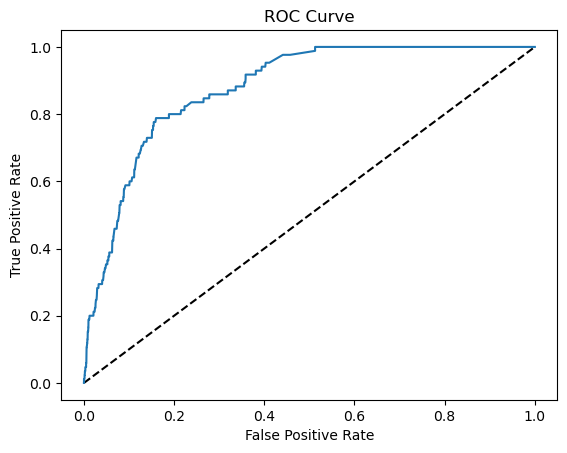

AUC: 0.8785045598895189


In [80]:
fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob)
plt.plot([0, 1], [0, 1], 'k--')
plt.plot(fpr, tpr)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.show()
print("AUC: {}".format(roc_auc_score(y_test, y_pred_prob)))

In [88]:
from sklearn.inspection import permutation_importance

In [90]:
feature_names = list(X_train.columns)

features = np.array(feature_names)

Text(0.5, 0, 'MDI Importance')

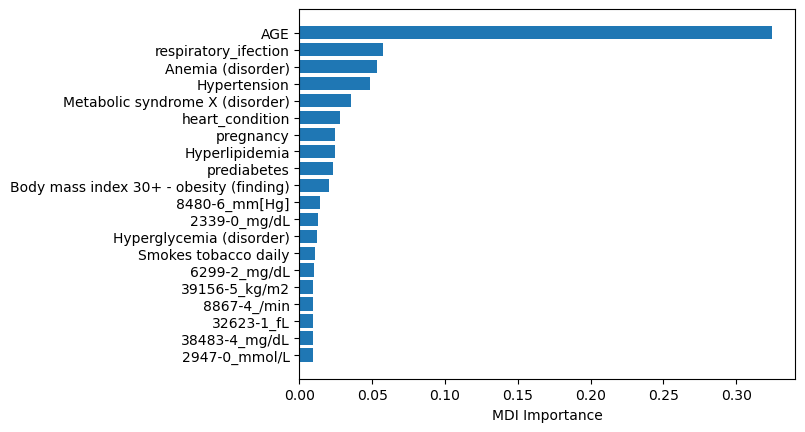

In [92]:
importances = best_model.feature_importances_
forest_importances = pd.Series(importances, index=features)

sorted_idx = forest_importances.argsort()[-20:]
plt.barh(features[sorted_idx], forest_importances[sorted_idx])
plt.xlabel("MDI Importance")

#Conclusion

The most important predictive features of diabetes are age, respiratory infections, anemia and hypertension.